**Most Dog Friendly Neighbourhoods in Toronto**

*Importing Libraries*

In [1]:
from bs4 import BeautifulSoup
import json # library to handle JSON files
import numpy as np
import pandas as pd
import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors
import urllib
import matplotlib.pyplot as plt

# import k-means from clustering stage
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

from geopy.geocoders import Nominatim # convert an address into latitude and longitude values
import folium # map rendering library
import geocoder

import altair as alt
alt.renderers.enable('notebook') # show and interact ith plots in jupyter notebook

RendererRegistry.enable('notebook')

*Loading the Toronto Open Data Pet Licensing data set from 2017 that includes the number of cat and dog licenses issued per FSA in 2017*

In [2]:
df_pets_2017=pd.read_excel("2017_dog_and_cat_licence_FSA.xls",skiprows=2)
df_pets_2017.head()

,FSA,CAT,DOG,Total
0,M1B,285,627,912
1,M1C,297,775,1072
2,M1E,467,963,1430
3,M1G,220,385,605
4,M1H,155,309,464


*Loading the same data from 2013*

In [3]:
df_pets_2013=pd.read_excel("2013 licences sold by fsa.xls",skiprows=3)
df_pets_2013.head()

,Unnamed: 0,CAT,DOG,Total
0,M0M,0,1,1
1,M1B,293,674,967
2,M1C,387,967,1354
3,M1E,536,1085,1621
4,M1G,252,457,709


*Renaming the unnamed column*

In [4]:
df_pets_2013.rename(columns={'Unnamed: 0':'FSA'},inplace=True)
df_pets_2013.head()

,FSA,CAT,DOG,Total
0,M0M,0,1,1
1,M1B,293,674,967
2,M1C,387,967,1354
3,M1E,536,1085,1621
4,M1G,252,457,709


*Loading population data from CSV File*

In [5]:
df_pop=pd.read_csv("T1201EN.csv")
df_pop.head()

,Geographic code,Geographic name,Province or territory,"Incompletely enumerated Indian reserves and Indian settlements, 2016","Population, 2016","Total private dwellings, 2016","Private dwellings occupied by usual residents, 2016"
0,01,Canada,NaN,T,35151728.0,15412443.0,14072079.0
1,A0A,A0A,Newfoundland and Labrador,NaN,46587.0,26155.0,19426.0
2,A0B,A0B,Newfoundland and Labrador,NaN,19792.0,13658.0,8792.0
3,A0C,A0C,Newfoundland and Labrador,NaN,12587.0,8010.0,5606.0
4,A0E,A0E,Newfoundland and Labrador,NaN,22294.0,12293.0,9603.0


*Dropping the columns we aren't  interested in*

In [6]:
df_pop=df_pop[['Geographic code','Population, 2016']]
df_pop.head()

,Geographic code,"Population, 2016"
0,01,35151728.0
1,A0A,46587.0
2,A0B,19792.0
3,A0C,12587.0
4,A0E,22294.0


**Check details of imported data**

In [7]:
df_pets_2017.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 98 entries, 0 to 97
Data columns (total 4 columns):
FSA      98 non-null object
CAT      98 non-null int64
DOG      98 non-null int64
Total    98 non-null int64
dtypes: int64(3), object(1)
memory usage: 3.1+ KB


In [8]:
df_pets_2013.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 135 entries, 0 to 134
Data columns (total 4 columns):
FSA      135 non-null object
CAT      135 non-null int64
DOG      135 non-null int64
Total    135 non-null int64
dtypes: int64(3), object(1)
memory usage: 4.3+ KB


In [9]:
df_pets_2013.isnull().any()

FSA      False
CAT      False
DOG      False
Total    False
dtype: bool

In [10]:
df_pets_2017.isnull().any()

FSA      False
CAT      False
DOG      False
Total    False
dtype: bool

In [11]:
df_pop.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1648 entries, 0 to 1647
Data columns (total 2 columns):
Geographic code     1648 non-null object
Population, 2016    1642 non-null float64
dtypes: float64(1), object(1)
memory usage: 25.8+ KB


In [12]:
df_pop.isnull().any()

Geographic code     False
Population, 2016     True
dtype: bool

In [13]:
nan_rows = df_pop[df_pop['Population, 2016'].isnull()]
nan_rows

,Geographic code,"Population, 2016"
1642,Note:,NaN
1643,Incompletely enumerated Indian reserves and In...,NaN
1644,"For further information, refer to: http://www1...",NaN
1645,"Source: Statistics Canada, 2016 Census of Popu...",NaN
1646,How to cite: Statistics Canada. 2017. Populati...,NaN
1647,Statistics Canada Catalogue no. 98-402-X201600...,NaN


In [14]:
df_pop=df_pop.dropna().rename(columns={'Geographic code': 'FSA', 'Population, 2016': 'Pop'})
df_pop.head()

,FSA,Pop
0,01,35151728.0
1,A0A,46587.0
2,A0B,19792.0
3,A0C,12587.0
4,A0E,22294.0


*Importing Toronto Neighbourhoods dataset from past lab*

In [15]:
toronto_df=pd.read_csv("toronto_hoods.csv")
toronto_df.head()

,Postcode,Borough,Neighbourhood
0,M1B,Scarborough,"Rouge, Malvern"
1,M1C,Scarborough,"Highland Creek, Rouge Hill, Port Union"
2,M1E,Scarborough,"Guildwood, Morningside, West Hill"
3,M1G,Scarborough,Woburn
4,M1H,Scarborough,Cedarbrae


In [16]:
toronto_df.rename(columns={'Postcode':'FSA'},inplace=True)
toronto_df.head()

,FSA,Borough,Neighbourhood
0,M1B,Scarborough,"Rouge, Malvern"
1,M1C,Scarborough,"Highland Creek, Rouge Hill, Port Union"
2,M1E,Scarborough,"Guildwood, Morningside, West Hill"
3,M1G,Scarborough,Woburn
4,M1H,Scarborough,Cedarbrae


*Joining two datasets on the FSA column (Pets and Neighbourhood)*

In [17]:
toronto_merged=toronto_df.join(df_pets_2017.set_index('FSA'),on='FSA')
toronto_merged.head()

,FSA,Borough,Neighbourhood,CAT,DOG,Total
0,M1B,Scarborough,"Rouge, Malvern",285.0,627.0,912.0
1,M1C,Scarborough,"Highland Creek, Rouge Hill, Port Union",297.0,775.0,1072.0
2,M1E,Scarborough,"Guildwood, Morningside, West Hill",467.0,963.0,1430.0
3,M1G,Scarborough,Woburn,220.0,385.0,605.0
4,M1H,Scarborough,Cedarbrae,155.0,309.0,464.0


In [18]:
toronto_merged=toronto_merged.rename(columns={'Total':'Total_2017'})
toronto_merged.head()

,FSA,Borough,Neighbourhood,CAT,DOG,Total_2017
0,M1B,Scarborough,"Rouge, Malvern",285.0,627.0,912.0
1,M1C,Scarborough,"Highland Creek, Rouge Hill, Port Union",297.0,775.0,1072.0
2,M1E,Scarborough,"Guildwood, Morningside, West Hill",467.0,963.0,1430.0
3,M1G,Scarborough,Woburn,220.0,385.0,605.0
4,M1H,Scarborough,Cedarbrae,155.0,309.0,464.0


*Merging in data from population and 2013 licences to single DataFrame*

In [19]:
df_pets_2013=df_pets_2013.rename(columns={'Total':'Total_2013'})
toronto_merged = toronto_merged.join(df_pets_2013[['FSA','Total_2013']].set_index('FSA'),on='FSA')
toronto_merged.head(5)

,FSA,Borough,Neighbourhood,CAT,DOG,Total_2017,Total_2013
0,M1B,Scarborough,"Rouge, Malvern",285.0,627.0,912.0,967.0
1,M1C,Scarborough,"Highland Creek, Rouge Hill, Port Union",297.0,775.0,1072.0,1354.0
2,M1E,Scarborough,"Guildwood, Morningside, West Hill",467.0,963.0,1430.0,1621.0
3,M1G,Scarborough,Woburn,220.0,385.0,605.0,709.0
4,M1H,Scarborough,Cedarbrae,155.0,309.0,464.0,545.0


In [20]:
toronto_merged = toronto_merged.join(df_pop.set_index('FSA'),on='FSA').dropna()
toronto_merged.head(5)

,FSA,Borough,Neighbourhood,CAT,DOG,Total_2017,Total_2013,Pop
0,M1B,Scarborough,"Rouge, Malvern",285.0,627.0,912.0,967.0,66108.0
1,M1C,Scarborough,"Highland Creek, Rouge Hill, Port Union",297.0,775.0,1072.0,1354.0,35626.0
2,M1E,Scarborough,"Guildwood, Morningside, West Hill",467.0,963.0,1430.0,1621.0,46943.0
3,M1G,Scarborough,Woburn,220.0,385.0,605.0,709.0,29690.0
4,M1H,Scarborough,Cedarbrae,155.0,309.0,464.0,545.0,24383.0


*Getting Coordinates of each Neighbourhood*

In [154]:
bing_key=' '

In [22]:
def get_lats_longs(df):
    '''
    This function uses GeoCoder to retrieve the latitude and longitude for neighbourhoods.
    Inputs:
        df: dataframe to loop through. Adds new Latitude and Longitude columns to this dataframe
    '''
    lat_lng_coords = None
    # create lists to store our new lats and longs
    lats = []
    longs=[]
    #loop through our dataframe and look up the lat/long of each postal code
    for index, row in df.iterrows():
        postal_code=row[0]
        # loop until you get the coordinates
        lat_lng_coords = None
        while(lat_lng_coords is None):
            g = geocoder.bing('{}, Toronto, Ontario'.format(postal_code),key=bing_key)
            lat_lng_coords = g.latlng

        lats.append(lat_lng_coords[0])
        longs.append(lat_lng_coords[1])

    df['Latitude'] = lats
    df['Longitude'] = longs
    return df

In [23]:
toronto_merged = get_lats_longs(toronto_merged)
toronto_merged.head()

,FSA,Borough,Neighbourhood,CAT,DOG,Total_2017,Total_2013,Pop,Latitude,Longitude
0,M1B,Scarborough,"Rouge, Malvern",285.0,627.0,912.0,967.0,66108.0,43.810154,-79.194603
1,M1C,Scarborough,"Highland Creek, Rouge Hill, Port Union",297.0,775.0,1072.0,1354.0,35626.0,43.784672,-79.158958
2,M1E,Scarborough,"Guildwood, Morningside, West Hill",467.0,963.0,1430.0,1621.0,46943.0,43.766289,-79.172890
3,M1G,Scarborough,Woburn,220.0,385.0,605.0,709.0,29690.0,43.768288,-79.214111
4,M1H,Scarborough,Cedarbrae,155.0,309.0,464.0,545.0,24383.0,43.769180,-79.238770


*Checking details of merged DF*

In [24]:
toronto_merged.isnull().any()

FSA              False
Borough          False
Neighbourhood    False
CAT              False
DOG              False
Total_2017       False
Total_2013       False
Pop              False
Latitude         False
Longitude        False
dtype: bool

In [25]:
toronto_merged.shape

(97, 10)

*Dropping the outlier data*

In [26]:
toronto_merged=toronto_merged.sort_values('Pop')
toronto_merged.head()

,FSA,Borough,Neighbourhood,CAT,DOG,Total_2017,Total_2013,Pop,Latitude,Longitude
69,M5W,Downtown Toronto,Stn A PO Boxes 25 The Esplanade,6.0,0.0,6.0,1.0,15.0,43.648689,-79.385437
58,M5H,Downtown Toronto,"Adelaide, King, Richmond",6.0,38.0,44.0,30.0,2005.0,43.650410,-79.382881
55,M5C,Downtown Toronto,St. James Town,20.0,71.0,91.0,78.0,2951.0,43.651211,-79.375481
30,M3K,North York,"CFB Toronto, Downsview East",51.0,122.0,173.0,168.0,5997.0,43.737659,-79.467323
23,M2P,North York,York Mills West,66.0,259.0,325.0,391.0,7843.0,43.749180,-79.399178


In [27]:
i = toronto_merged[(toronto_merged['FSA'] == 'M5W')].index
toronto_merged=toronto_merged.drop(i)
toronto_merged.head()

,FSA,Borough,Neighbourhood,CAT,DOG,Total_2017,Total_2013,Pop,Latitude,Longitude
58,M5H,Downtown Toronto,"Adelaide, King, Richmond",6.0,38.0,44.0,30.0,2005.0,43.650410,-79.382881
55,M5C,Downtown Toronto,St. James Town,20.0,71.0,91.0,78.0,2951.0,43.651211,-79.375481
30,M3K,North York,"CFB Toronto, Downsview East",51.0,122.0,173.0,168.0,5997.0,43.737659,-79.467323
23,M2P,North York,York Mills West,66.0,259.0,325.0,391.0,7843.0,43.749180,-79.399178
57,M5G,Downtown Toronto,Central Bay Street,48.0,83.0,131.0,93.0,8423.0,43.656078,-79.384918


**Exploratory Data Analysis**  
__Meanings of the new columns:__  
*PropTotal_2017: proportion of the licenese granted in Toronto in 2017 that were granted to this FSA  
PropDogs: of the licenses granted in this FSA, what percentage were granted for Dogs vs Cats?  
PetChange: Total Pets 2017 - Total Pets 2013  
PropTotal_2013: proportion of the licenese granted in Toronto in 2017 that were granted to this FSA  
PetChange_Prop: PropTotal_2017 - PropTotal_2013 (change in proportion of pets belong to this FSA)  
PerCapitaPetsTotal: pets/pop in FSA (number of new pets registered in FSA per person*

In [28]:
# add a column that represents the proportion of pets per FSA for mapping
toronto_merged['PropTotal_2017'] = round((toronto_merged['Total_2017']/sum(toronto_merged['Total_2017']))*100,2) #prop of total pets in city that are in this FSA
toronto_merged['PropDogs']= round((toronto_merged['DOG']/toronto_merged['Total_2017'])*100,2) #prop of pets in FSA that are dogs
toronto_merged=toronto_merged.sort_values('PropTotal_2017',ascending=False)

In [29]:
### Neighbourhoods with highest percentage of pets
toronto_merged.head()

,FSA,Borough,Neighbourhood,CAT,DOG,Total_2017,Total_2013,Pop,Latitude,Longitude,PropTotal_2017,PropDogs
36,M4C,East York,Woodbine Heights,663.0,1201.0,1864.0,1868.0,46866.0,43.689819,-79.310364,2.30,64.43
88,M8V,Etobicoke,"Humber Bay Shores, Mimico South, New Toronto",613.0,1235.0,1848.0,1603.0,37975.0,43.609921,-79.497879,2.28,66.83
42,M4L,East Toronto,"The Beaches West, India Bazaar",513.0,1315.0,1828.0,1880.0,32640.0,43.670906,-79.316269,2.26,71.94
82,M6P,West Toronto,"High Park, The Junction South",630.0,1179.0,1809.0,1663.0,40035.0,43.661224,-79.463486,2.23,65.17
76,M6H,West Toronto,"Dovercourt Village, Dufferin",676.0,1085.0,1761.0,1604.0,44950.0,43.665081,-79.438728,2.18,61.61


In [30]:
### Neighbourhoods with lowest percentage of pets
toronto_merged.tail()

,FSA,Borough,Neighbourhood,CAT,DOG,Total_2017,Total_2013,Pop,Latitude,Longitude,PropTotal_2017,PropDogs
16,M1X,Scarborough,Upper Rouge,35.0,113.0,148.0,161.0,15097.0,43.834435,-79.218910,0.18,76.35
57,M5G,Downtown Toronto,Central Bay Street,48.0,83.0,131.0,93.0,8423.0,43.656078,-79.384918,0.16,63.36
39,M4H,East York,Thorncliffe Park,57.0,69.0,126.0,124.0,19688.0,43.698383,-79.358803,0.16,54.76
55,M5C,Downtown Toronto,St. James Town,20.0,71.0,91.0,78.0,2951.0,43.651211,-79.375481,0.11,78.02
58,M5H,Downtown Toronto,"Adelaide, King, Richmond",6.0,38.0,44.0,30.0,2005.0,43.650410,-79.382881,0.05,86.36


*Adding a flag for PetFriendly areas (if PropDogs >= 70)*

In [31]:
# add a flag
toronto_merged['PetFriendly']=toronto_merged['PropDogs'].apply(lambda x: 1 if x >=70 else 0)
toronto_merged.head()

,FSA,Borough,Neighbourhood,CAT,DOG,Total_2017,Total_2013,Pop,Latitude,Longitude,PropTotal_2017,PropDogs,PetFriendly
36,M4C,East York,Woodbine Heights,663.0,1201.0,1864.0,1868.0,46866.0,43.689819,-79.310364,2.30,64.43,0
88,M8V,Etobicoke,"Humber Bay Shores, Mimico South, New Toronto",613.0,1235.0,1848.0,1603.0,37975.0,43.609921,-79.497879,2.28,66.83,0
42,M4L,East Toronto,"The Beaches West, India Bazaar",513.0,1315.0,1828.0,1880.0,32640.0,43.670906,-79.316269,2.26,71.94,1
82,M6P,West Toronto,"High Park, The Junction South",630.0,1179.0,1809.0,1663.0,40035.0,43.661224,-79.463486,2.23,65.17,0
76,M6H,West Toronto,"Dovercourt Village, Dufferin",676.0,1085.0,1761.0,1604.0,44950.0,43.665081,-79.438728,2.18,61.61,0


**Creating a Map of Toronto Neighbourhoods by using Folium**

In [32]:
address = 'Toronto, ON'

geolocator = Nominatim()
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Toronto are {}, {}.'.format(latitude, longitude))

C:\Users\tahab\Anaconda3\envs\environment_35\lib\site-packages\ipykernel_launcher.py:3: DeprecationWarning: Using Nominatim with the default "geopy/1.20.0" `user_agent` is strongly discouraged, as it violates Nominatim's ToS https://operations.osmfoundation.org/policies/nominatim/ and may possibly cause 403 and 429 HTTP errors. Please specify a custom `user_agent` with `Nominatim(user_agent="my-application")` or by overriding the default `user_agent`: `geopy.geocoders.options.default_user_agent = "my-application"`. In geopy 2.0 this will become an exception.
  This is separate from the ipykernel package so we can avoid doing imports until


The geograpical coordinate of Toronto are 43.653963, -79.387207.


In [34]:
# # create map of Toronto Neighbourhoods (FSAs) using retrived latitude and longitude values
map_toronto_pop = folium.Map(location=[latitude, longitude], zoom_start=10)
map_toronto_pop.choropleth(geo_data="Toronto2.geojson",
data = toronto_merged,
columns=['FSA','Pop'],
key_on='feature.properties.CFSAUID',
fill_color='YlOrRd',
fill_opacity=0.7, 
line_opacity=0.2,
legend_name='Population by FSA')   
map_toronto_pop

C:\Users\tahab\Anaconda3\envs\environment_35\lib\site-packages\folium\folium.py:415: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


In [33]:
# # create map of Toronto Neighbourhoods (FSAs) using retrived latitude and longitude values
map_toronto_pop = folium.Map(location=[latitude, longitude], zoom_start=10)
map_toronto_pop.choropleth(geo_data="Toronto2.geojson",
data = toronto_merged,
columns=['FSA','Total_2017'],
key_on='feature.properties.CFSAUID',
fill_color='YlOrRd',
fill_opacity=0.7, 
line_opacity=0.2,
legend_name='Total Pet Licenses 2017')   
    
map_toronto_pop

C:\Users\tahab\Anaconda3\envs\environment_35\lib\site-packages\folium\folium.py:415: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


**Changes in Pet Ownership**:  
M5A and M5V have largest pet growth  
M1C, M9B, M1E, M9C, M8W are biggest decrease in pet licencing

In [34]:
toronto_merged['PetChange'] = toronto_merged['Total_2017']-toronto_merged['Total_2013']
toronto_merged.sort_values('PetChange',ascending=False, inplace=True)
toronto_merged.head(5)

,FSA,Borough,Neighbourhood,CAT,DOG,Total_2017,Total_2013,Pop,Latitude,Longitude,PropTotal_2017,PropDogs,PetFriendly,PetChange
53,M5A,Downtown Toronto,"Harbourfront, Regent Park",416.0,949.0,1365.0,966.0,41078.0,43.655220,-79.361969,1.69,69.52,0,399.0
68,M5V,Downtown Toronto,"CN Tower, Bathurst Quay, Island airport, Harbo...",353.0,987.0,1340.0,978.0,49195.0,43.640816,-79.399536,1.66,73.66,1,362.0
78,M6K,West Toronto,"Brockton, Exhibition Place, Parkdale Village",427.0,876.0,1303.0,1045.0,40957.0,43.639408,-79.424026,1.61,67.23,0,258.0
88,M8V,Etobicoke,"Humber Bay Shores, Mimico South, New Toronto",613.0,1235.0,1848.0,1603.0,37975.0,43.609921,-79.497879,2.28,66.83,0,245.0
77,M6J,West Toronto,"Little Portugal, Trinity",382.0,807.0,1189.0,1020.0,32684.0,43.648556,-79.417770,1.47,67.87,0,169.0


In [35]:
toronto_merged['PropTotal_2013'] = round((toronto_merged['Total_2013']/sum(toronto_merged['Total_2013']))*100,2)
# CHange in proportion from 2013 to 2017
toronto_merged['PetChange_Prop'] = toronto_merged['PropTotal_2017']-toronto_merged['PropTotal_2013']
toronto_merged.sort_values('PetChange_Prop',ascending=False, inplace=True)
toronto_merged.head()

,FSA,Borough,Neighbourhood,CAT,DOG,Total_2017,Total_2013,Pop,Latitude,Longitude,PropTotal_2017,PropDogs,PetFriendly,PetChange,PropTotal_2013,PetChange_Prop
53,M5A,Downtown Toronto,"Harbourfront, Regent Park",416.0,949.0,1365.0,966.0,41078.0,43.655220,-79.361969,1.69,69.52,0,399.0,1.20,0.49
68,M5V,Downtown Toronto,"CN Tower, Bathurst Quay, Island airport, Harbo...",353.0,987.0,1340.0,978.0,49195.0,43.640816,-79.399536,1.66,73.66,1,362.0,1.21,0.45
78,M6K,West Toronto,"Brockton, Exhibition Place, Parkdale Village",427.0,876.0,1303.0,1045.0,40957.0,43.639408,-79.424026,1.61,67.23,0,258.0,1.30,0.31
88,M8V,Etobicoke,"Humber Bay Shores, Mimico South, New Toronto",613.0,1235.0,1848.0,1603.0,37975.0,43.609921,-79.497879,2.28,66.83,0,245.0,1.99,0.29
52,M4Y,Downtown Toronto,Church and Wellesley,237.0,604.0,841.0,673.0,30472.0,43.666336,-79.381195,1.04,71.82,1,168.0,0.83,0.21


**Mapping the number of changes of Pet Licenses**

In [36]:
# # create map of Toronto Neighbourhoods (FSAs) using retrived latitude and longitude values
map_toronto_pop = folium.Map(location=[latitude, longitude], zoom_start=10)
map_toronto_pop.choropleth(geo_data="Toronto2.geojson",
data = toronto_merged,
columns=['FSA','PetChange'],
key_on='feature.properties.CFSAUID',
fill_color='YlOrRd',
fill_opacity=0.7, 
line_opacity=0.2,
legend_name='Change in Number of Issued Pet Licenses (2013-2017)')   
map_toronto_pop

C:\Users\tahab\Anaconda3\envs\environment_35\lib\site-packages\folium\folium.py:415: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


**Calculating Per Capita Pet Ownership**

In [37]:
# # get proportion of pets relative to population 2017
toronto_merged['PerCapitaPets']=round((toronto_merged['Total_2017']/toronto_merged['Pop']),4)
toronto_merged.reset_index()
toronto_merged.sort_values('PerCapitaPets', ascending=False,inplace=True)
toronto_merged.head()

,FSA,Borough,Neighbourhood,CAT,DOG,Total_2017,Total_2013,Pop,Latitude,Longitude,PropTotal_2017,PropDogs,PetFriendly,PetChange,PropTotal_2013,PetChange_Prop,PerCapitaPets
37,M4E,East Toronto,The Beaches,430.0,1181.0,1611.0,1582.0,25044.0,43.679611,-79.295692,1.99,73.31,1,29.0,1.96,0.03,0.0643
83,M6R,West Toronto,"Parkdale, Roncesvalles",417.0,780.0,1197.0,1182.0,19857.0,43.648239,-79.450447,1.48,65.16,0,15.0,1.47,0.01,0.0603
89,M8W,Etobicoke,"Alderwood, Long Branch",400.0,815.0,1215.0,1347.0,20674.0,43.600727,-79.539734,1.50,67.08,0,-132.0,1.67,-0.17,0.0588
48,M4T,Central Toronto,"Moore Park, Summerhill East",114.0,493.0,607.0,627.0,10463.0,43.690735,-79.383003,0.75,81.22,1,-20.0,0.78,-0.03,0.0580
46,M4R,Central Toronto,North Toronto West,170.0,481.0,651.0,620.0,11394.0,43.714615,-79.406532,0.80,73.89,1,31.0,0.77,0.03,0.0571


In [38]:
# # create map of Toronto Neighbourhoods (FSAs) using retrived latitude and longitude values
map_toronto_pop = folium.Map(location=[latitude, longitude], zoom_start=10)
map_toronto_pop.choropleth(geo_data="Toronto2.geojson",
data = toronto_merged,
columns=['FSA','PerCapitaPets'],
key_on='feature.properties.CFSAUID',
fill_color='YlOrRd',
fill_opacity=0.7, 
line_opacity=0.2,
legend_name='Per Capita Pet Licenses Issued 2017)')   
    
map_toronto_pop

C:\Users\tahab\Anaconda3\envs\environment_35\lib\site-packages\folium\folium.py:415: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


In [39]:
merged_boroughs=toronto_merged.groupby('Borough').sum().reset_index() 

# Need to recalcualte some columsn (i.e. PerCapitaPets)
merged_boroughs["PerCapitaPets"] = merged_boroughs['Total_2017']/merged_boroughs['Pop']
merged_boroughs['PropDogs']= round((merged_boroughs['DOG']/merged_boroughs['Total_2017'])*100,2) #prop of pets in FSA that are dogs


In [40]:
# also we summed the lats and longs, which isn't correct!  so let's re-retrieve our correct coordinatoes
merged_boroughs=get_lats_longs(merged_boroughs)
merged_boroughs

,Borough,CAT,DOG,Total_2017,Total_2013,Pop,Latitude,Longitude,PropTotal_2017,PropDogs,PetFriendly,PetChange,PropTotal_2013,PetChange_Prop,PerCapitaPets
0,Central Toronto,1717.0,5901.0,7618.0,7241.0,164502.0,43.609450,-79.492730,9.41,77.46,9,377.0,8.99,0.42,0.046309
1,Downtown Toronto,2277.0,5546.0,7823.0,6493.0,271161.0,43.648689,-79.385437,9.66,70.89,8,1330.0,8.05,1.61,0.028850
2,East Toronto,1660.0,4251.0,5911.0,5816.0,113956.0,43.628719,-79.412827,7.30,71.92,3,95.0,7.21,0.09,0.051871
3,East York,1830.0,3670.0,5500.0,5495.0,139996.0,43.691799,-79.327026,6.80,66.73,1,5.0,6.81,-0.01,0.039287
4,Etobicoke,3879.0,8786.0,12665.0,13186.0,365318.0,43.644402,-79.567139,15.65,69.37,5,-521.0,16.37,-0.72,0.034668
5,North York,4208.0,9727.0,13935.0,14193.0,658944.0,43.768261,-79.412628,17.19,69.80,10,-258.0,17.61,-0.42,0.021147
6,Scarborough,4366.0,8964.0,13330.0,14567.0,634047.0,43.772228,-79.256660,16.47,67.25,5,-1237.0,18.06,-1.59,0.021024
7,West Toronto,3048.0,5904.0,8952.0,8221.0,212782.0,43.629219,-79.419853,11.06,65.95,0,731.0,10.21,0.85,0.042071
8,York,1504.0,3710.0,5214.0,5389.0,171388.0,43.692081,-79.478630,6.45,71.15,4,-175.0,6.69,-0.24,0.030422


**The Mosts:**

In [41]:
print("Most Pets 2017: {}".format(merged_boroughs['Total_2017'].max()))
#merged_boroughs[(merged_boroughs['Total_2017']==merged_boroughs['Total_2017'].max())]["Borough"]
#merged_boroughs.loc[merged_boroughs['Total_2017'].idxmax()]["Borough"]
print("Most Pets 2017: {}".format(merged_boroughs.loc[merged_boroughs['Total_2017'].idxmax()]["Borough"]))
print("Most Pets 2013: {}".format(merged_boroughs.loc[merged_boroughs['Total_2013'].idxmax()]["Borough"]))
print("Highest proportion: {}".format(merged_boroughs.loc[merged_boroughs['PropTotal_2017'].idxmax()]["Borough"]))
print("Biggest change in pet proportion: {}".format(merged_boroughs.loc[merged_boroughs['PetChange_Prop'].idxmax()]["Borough"]))
print("Most per capita pets: {}".format(merged_boroughs.loc[merged_boroughs['PerCapitaPets'].idxmax()]["Borough"]))

Most Pets 2017: 13935.0
Most Pets 2017: North York
Most Pets 2013: Scarborough
Highest proportion: North York
Biggest change in pet proportion: Downtown Toronto
Most per capita pets: East Toronto


In [42]:
merged_boroughs.sort_values('Total_2017', ascending=False)

,Borough,CAT,DOG,Total_2017,Total_2013,Pop,Latitude,Longitude,PropTotal_2017,PropDogs,PetFriendly,PetChange,PropTotal_2013,PetChange_Prop,PerCapitaPets
5,North York,4208.0,9727.0,13935.0,14193.0,658944.0,43.768261,-79.412628,17.19,69.80,10,-258.0,17.61,-0.42,0.021147
6,Scarborough,4366.0,8964.0,13330.0,14567.0,634047.0,43.772228,-79.256660,16.47,67.25,5,-1237.0,18.06,-1.59,0.021024
4,Etobicoke,3879.0,8786.0,12665.0,13186.0,365318.0,43.644402,-79.567139,15.65,69.37,5,-521.0,16.37,-0.72,0.034668
7,West Toronto,3048.0,5904.0,8952.0,8221.0,212782.0,43.629219,-79.419853,11.06,65.95,0,731.0,10.21,0.85,0.042071
1,Downtown Toronto,2277.0,5546.0,7823.0,6493.0,271161.0,43.648689,-79.385437,9.66,70.89,8,1330.0,8.05,1.61,0.028850
0,Central Toronto,1717.0,5901.0,7618.0,7241.0,164502.0,43.609450,-79.492730,9.41,77.46,9,377.0,8.99,0.42,0.046309
2,East Toronto,1660.0,4251.0,5911.0,5816.0,113956.0,43.628719,-79.412827,7.30,71.92,3,95.0,7.21,0.09,0.051871
3,East York,1830.0,3670.0,5500.0,5495.0,139996.0,43.691799,-79.327026,6.80,66.73,1,5.0,6.81,-0.01,0.039287
8,York,1504.0,3710.0,5214.0,5389.0,171388.0,43.692081,-79.478630,6.45,71.15,4,-175.0,6.69,-0.24,0.030422


In [43]:
merged_boroughs.sort_values('PerCapitaPets',inplace=True, ascending=False)
merged_boroughs

,Borough,CAT,DOG,Total_2017,Total_2013,Pop,Latitude,Longitude,PropTotal_2017,PropDogs,PetFriendly,PetChange,PropTotal_2013,PetChange_Prop,PerCapitaPets
2,East Toronto,1660.0,4251.0,5911.0,5816.0,113956.0,43.628719,-79.412827,7.30,71.92,3,95.0,7.21,0.09,0.051871
0,Central Toronto,1717.0,5901.0,7618.0,7241.0,164502.0,43.609450,-79.492730,9.41,77.46,9,377.0,8.99,0.42,0.046309
7,West Toronto,3048.0,5904.0,8952.0,8221.0,212782.0,43.629219,-79.419853,11.06,65.95,0,731.0,10.21,0.85,0.042071
3,East York,1830.0,3670.0,5500.0,5495.0,139996.0,43.691799,-79.327026,6.80,66.73,1,5.0,6.81,-0.01,0.039287
4,Etobicoke,3879.0,8786.0,12665.0,13186.0,365318.0,43.644402,-79.567139,15.65,69.37,5,-521.0,16.37,-0.72,0.034668
8,York,1504.0,3710.0,5214.0,5389.0,171388.0,43.692081,-79.478630,6.45,71.15,4,-175.0,6.69,-0.24,0.030422
1,Downtown Toronto,2277.0,5546.0,7823.0,6493.0,271161.0,43.648689,-79.385437,9.66,70.89,8,1330.0,8.05,1.61,0.028850
5,North York,4208.0,9727.0,13935.0,14193.0,658944.0,43.768261,-79.412628,17.19,69.80,10,-258.0,17.61,-0.42,0.021147
6,Scarborough,4366.0,8964.0,13330.0,14567.0,634047.0,43.772228,-79.256660,16.47,67.25,5,-1237.0,18.06,-1.59,0.021024


**4sq API for each neighbourhood to get the list of venues:**

In [153]:
CLIENT_ID = '' # your Foursquare ID
CLIENT_SECRET = '' # your Foursquare Secret
VERSION = '20190727' # Foursquare API version

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: 
CLIENT_SECRET:


In [49]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    '''Call FourSquare api to retrieve nearby Pet Stores and Pet services'''
    
    venues_list=[]
    categoryID='4bf58dd8d48988d100951735,5032897c91d4c4b30a586d69' # pet services and petstore
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
        
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}&categoryId={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT,
            categoryID)
        #print(requests.get(url).json())
        try:
            # make the GET request
            results = requests.get(url).json()["response"]['groups'][0]['items']
        except:
            print('Your quota may have been exceeded')
            return
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [52]:
LIMIT=100
radius = 1000
toronto_venues = getNearbyVenues(names=toronto_merged['Neighbourhood'],latitudes=toronto_merged['Latitude'],longitudes=toronto_merged['Longitude'],radius=radius)

The Beaches
Parkdale, Roncesvalles
Alderwood, Long Branch
Moore Park, Summerhill East
North Toronto West
Leaside
Birch Cliff, Cliffside West
The Beaches West, India Bazaar
The Kingsway, Montgomery Road, Old Mill North
Lawrence Park
Kingsway Park South West, Mimico NW, The Queensway West, Royal York South West, South of Bloor
Rosedale
Runnymede, Swansea
Forest Hill North, Forest Hill West
Humber Bay Shores, Mimico South, New Toronto
Deer Park, Forest Hill SE, Rathnelly, South Hill, Summerhill West
Bedford Park, Lawrence Manor East
East Toronto
Humber Bay, King's Mill Park, Kingsway Park South East, Mimico NE, Old Mill South, The Queensway East, Royal York South East, Sunnylea
Davisville
High Park, The Junction South
The Danforth West, Riverdale
Studio District
Davisville North
York Mills West
Cloverdale, Islington, Martin Grove, Princess Gardens, West Deane Park
Woodbine Gardens, Parkview Hill
Woodbine Heights
Christie
Roselawn
Dovercourt Village, Dufferin
Humewood-Cedarvale
Cliffcrest,

In [56]:
toronto_venues.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,The Beaches,43.679611,-79.295692,Tails,43.670762,-79.296424,Pet Store
1,The Beaches,43.679611,-79.295692,The Dog Market,43.671163,-79.294773,Pet Store
2,The Beaches,43.679611,-79.295692,Pet Valu,43.672517,-79.288923,Pet Store
3,"Parkdale, Roncesvalles",43.648239,-79.450447,Kennel Cafe,43.647860,-79.449777,Pet Store
4,"Parkdale, Roncesvalles",43.648239,-79.450447,Fetch,43.650127,-79.450548,Pet Store


In [59]:
def getNearbyVenues_query(names, latitudes, longitudes, radius=500):
    '''Call FourSquare api to retrieve nearby Pet Stores and Pet services'''
    
    venues_list=[]
    categoryID='4bf58dd8d48988d1e5941735' # Dog Run
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
        
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}&categoryId={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT,
            categoryID)
        #print(requests.get(url).json())
        try:
            # make the GET request
            results = requests.get(url).json()["response"]['groups'][0]['items']
        except:
            print('Your quota may have been exceeded')
            return
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [60]:
dog_friendly_venues = getNearbyVenues_query(names=toronto_merged['Neighbourhood'],latitudes=toronto_merged['Latitude'],longitudes=toronto_merged['Longitude'],radius=radius)

The Beaches
Parkdale, Roncesvalles
Alderwood, Long Branch
Moore Park, Summerhill East
North Toronto West
Leaside
Birch Cliff, Cliffside West
The Beaches West, India Bazaar
The Kingsway, Montgomery Road, Old Mill North
Lawrence Park
Kingsway Park South West, Mimico NW, The Queensway West, Royal York South West, South of Bloor
Rosedale
Runnymede, Swansea
Forest Hill North, Forest Hill West
Humber Bay Shores, Mimico South, New Toronto
Deer Park, Forest Hill SE, Rathnelly, South Hill, Summerhill West
Bedford Park, Lawrence Manor East
East Toronto
Humber Bay, King's Mill Park, Kingsway Park South East, Mimico NE, Old Mill South, The Queensway East, Royal York South East, Sunnylea
Davisville
High Park, The Junction South
The Danforth West, Riverdale
Studio District
Davisville North
York Mills West
Cloverdale, Islington, Martin Grove, Princess Gardens, West Deane Park
Woodbine Gardens, Parkview Hill
Woodbine Heights
Christie
Roselawn
Dovercourt Village, Dufferin
Humewood-Cedarvale
Cliffcrest,

In [62]:
dog_friendly_venues.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,The Beaches,43.679611,-79.295692,Norwood Dog Park,43.682375,-79.303778,Dog Run
1,The Beaches,43.679611,-79.295692,Cassels Avenue Playground,43.679956,-79.306886,Park
2,"Parkdale, Roncesvalles",43.648239,-79.450447,Sorauren Avenue Park,43.648443,-79.443405,Dog Run
3,"Parkdale, Roncesvalles",43.648239,-79.450447,Offleash Dog Trail - High Park,43.645485,-79.458747,Dog Run
4,"Parkdale, Roncesvalles",43.648239,-79.450447,Macgregor Park,43.652967,-79.441971,Park


*Merging Pet Services and Dog-Run Venues*

In [63]:
all_venues=toronto_venues.append(dog_friendly_venues, ignore_index=True)

In [82]:
all_venues

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,The Beaches,43.679611,-79.295692,Tails,43.670762,-79.296424,Pet Store
1,The Beaches,43.679611,-79.295692,The Dog Market,43.671163,-79.294773,Pet Store
2,The Beaches,43.679611,-79.295692,Pet Valu,43.672517,-79.288923,Pet Store
3,"Parkdale, Roncesvalles",43.648239,-79.450447,Kennel Cafe,43.647860,-79.449777,Pet Store
4,"Parkdale, Roncesvalles",43.648239,-79.450447,Fetch,43.650127,-79.450548,Pet Store
5,"Parkdale, Roncesvalles",43.648239,-79.450447,Ellen's Pet Care,43.654216,-79.451958,Pet Service
6,"Parkdale, Roncesvalles",43.648239,-79.450447,Pet Valu,43.655366,-79.457232,Pet Store
7,"Moore Park, Summerhill East",43.690735,-79.383003,Pet Valu,43.689462,-79.394634,Pet Store
8,"Moore Park, Summerhill East",43.690735,-79.383003,Pet Valu,43.689564,-79.394757,Pet Service
9,North Toronto West,43.714615,-79.406532,Pet Valu,43.714126,-79.399975,Pet Store


In [65]:
all_venues["Venue Category"].value_counts()

Pet Store               128
Dog Run                  81
Pet Service              63
Park                      7
Baseball Field            4
Veterinarian              4
Playground                1
Other Great Outdoors      1
Field                     1
Name: Venue Category, dtype: int64

**Merging all Venues with toronto_merged DF**

In [71]:
toronto_venues_merged = toronto_merged.set_index('Neighborhood').reset_index()
toronto_venues_merged.head()

,Neighborhood,FSA,Borough,CAT,DOG,Total_2017,Total_2013,Pop,Latitude,Longitude,PropTotal_2017,PropDogs,PetFriendly,PetChange,PropTotal_2013,PetChange_Prop,PerCapitaPets
0,The Beaches,M4E,East Toronto,430.0,1181.0,1611.0,1582.0,25044.0,43.679611,-79.295692,1.99,73.31,1,29.0,1.96,0.03,0.0643
1,"Parkdale, Roncesvalles",M6R,West Toronto,417.0,780.0,1197.0,1182.0,19857.0,43.648239,-79.450447,1.48,65.16,0,15.0,1.47,0.01,0.0603
2,"Alderwood, Long Branch",M8W,Etobicoke,400.0,815.0,1215.0,1347.0,20674.0,43.600727,-79.539734,1.50,67.08,0,-132.0,1.67,-0.17,0.0588
3,"Moore Park, Summerhill East",M4T,Central Toronto,114.0,493.0,607.0,627.0,10463.0,43.690735,-79.383003,0.75,81.22,1,-20.0,0.78,-0.03,0.0580
4,North Toronto West,M4R,Central Toronto,170.0,481.0,651.0,620.0,11394.0,43.714615,-79.406532,0.80,73.89,1,31.0,0.77,0.03,0.0571


In [73]:
toronto_venues_merged = toronto_venues_merged.merge(right=all_venues, how='outer', on='Neighborhood')
toronto_venues_merged.head()

,Neighborhood,FSA,Borough,CAT,DOG,Total_2017,Total_2013,Pop,Latitude,Longitude,...,PetChange,PropTotal_2013,PetChange_Prop,PerCapitaPets,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,The Beaches,M4E,East Toronto,430.0,1181.0,1611.0,1582.0,25044.0,43.679611,-79.295692,...,29.0,1.96,0.03,0.0643,43.679611,-79.295692,Tails,43.670762,-79.296424,Pet Store
1,The Beaches,M4E,East Toronto,430.0,1181.0,1611.0,1582.0,25044.0,43.679611,-79.295692,...,29.0,1.96,0.03,0.0643,43.679611,-79.295692,The Dog Market,43.671163,-79.294773,Pet Store
2,The Beaches,M4E,East Toronto,430.0,1181.0,1611.0,1582.0,25044.0,43.679611,-79.295692,...,29.0,1.96,0.03,0.0643,43.679611,-79.295692,Pet Valu,43.672517,-79.288923,Pet Store
3,The Beaches,M4E,East Toronto,430.0,1181.0,1611.0,1582.0,25044.0,43.679611,-79.295692,...,29.0,1.96,0.03,0.0643,43.679611,-79.295692,Norwood Dog Park,43.682375,-79.303778,Dog Run
4,The Beaches,M4E,East Toronto,430.0,1181.0,1611.0,1582.0,25044.0,43.679611,-79.295692,...,29.0,1.96,0.03,0.0643,43.679611,-79.295692,Cassels Avenue Playground,43.679956,-79.306886,Park


In [74]:
toronto_venues_merged.shape

(309, 23)

In [75]:
# are there any duplicate restaurants being counted in two neighborhoods?
df = toronto_venues_merged[toronto_venues_merged.duplicated(subset=['Venue','Venue Latitude','Venue Longitude'], keep=False)]
df.sort_values(by=['Venue'],inplace=True,ascending=False)
df=df.dropna()
print('There are {} services/shops counted as being in more than 1 neighborhood'.format(len(df)))
# however, maybe there is no need to clean this up, since what we're really concerned about is nearby ammenities

There are 97 services/shops counted as being in more than 1 neighborhood


C:\Users\tahab\Anaconda3\envs\environment_35\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [79]:
toronto_venues['Venue Category'].value_counts()

Pet Store       128
Pet Service      63
Veterinarian      4
Name: Venue Category, dtype: int64

In [135]:
toronto_venues_merged["Venue Category"].value_counts()

Pet Store               3792
Dog Run                 2580
Pet Service             1619
Baseball Field           188
Park                     170
Veterinarian             168
Playground                36
Field                      2
Other Great Outdoors       1
Name: Venue Category, dtype: int64

In [80]:
toronto_venues_merged.to_excel("toronto_venues_merged.xlsx")

In [83]:
toronto_merged.shape

(96, 17)

In [84]:
fsa_no_venues =toronto_venues_merged[(toronto_venues_merged['Venue'].isna())]
fsa_no_venues.shape

(19, 23)

In [85]:
fsa_no_venues = fsa_no_venues[['FSA','Borough','Neighborhood','Pop','Total_2017', 'PropTotal_2017', 'PerCapitaPets','Latitude','Longitude']]
fsa_no_venues['Venue'] = 0
fsa_no_venues.rename(columns={'Latitude': 'Neighborhood Latitude','Longitude': 'Neighborhood Longitude'}, inplace=True)
 
fsa_no_venues.head()

,FSA,Borough,Neighborhood,Pop,Total_2017,PropTotal_2017,PerCapitaPets,Neighborhood Latitude,Neighborhood Longitude,Venue
35,M4N,Central Toronto,Lawrence Park,15330.0,841.0,1.04,0.0549,43.728504,-79.388443,0
154,M2L,North York,"Silver Hills, York Mills",11717.0,410.0,0.51,0.0350,43.757595,-79.380737,0
168,M6E,York,Caledonia-Fairbanks,38041.0,1212.0,1.50,0.0319,43.686745,-79.450470,0
186,M3K,North York,"CFB Toronto, Downsview East",5997.0,173.0,0.21,0.0288,43.737659,-79.467323,0
219,M1R,Scarborough,"Maryvale, Wexford",29858.0,755.0,0.93,0.0253,43.751301,-79.299812,0


**Counting Venues for each Neighborhood**

In [86]:
toronto_counts = toronto_venues_merged[['FSA','Borough','Neighborhood', 'Pop','Total_2017', 'PropTotal_2017', 'PerCapitaPets', 'Neighborhood Latitude','Neighborhood Longitude','Venue Category','Venue']].groupby(['FSA','Borough','Neighborhood','Pop','Total_2017', 'PropTotal_2017', 'PerCapitaPets','Neighborhood Latitude','Neighborhood Longitude','Venue Category'], as_index=False).count()
toronto_counts.head(10)

,FSA,Borough,Neighborhood,Pop,Total_2017,PropTotal_2017,PerCapitaPets,Neighborhood Latitude,Neighborhood Longitude,Venue Category,Venue
0,M1B,Scarborough,"Rouge, Malvern",66108.0,912.0,1.13,0.0138,43.810154,-79.194603,Pet Store,2
1,M1C,Scarborough,"Highland Creek, Rouge Hill, Port Union",35626.0,1072.0,1.32,0.0301,43.784672,-79.158958,Pet Service,1
2,M1E,Scarborough,"Guildwood, Morningside, West Hill",46943.0,1430.0,1.77,0.0305,43.766289,-79.172890,Pet Service,2
3,M1G,Scarborough,Woburn,29690.0,605.0,0.75,0.0204,43.768288,-79.214111,Dog Run,1
4,M1K,Scarborough,"East Birchmount Park, Ionview, Kennedy Park",48434.0,1107.0,1.37,0.0229,43.725803,-79.262848,Pet Service,1
5,M1K,Scarborough,"East Birchmount Park, Ionview, Kennedy Park",48434.0,1107.0,1.37,0.0229,43.725803,-79.262848,Pet Store,1
6,M1M,Scarborough,"Cliffcrest, Cliffside, Scarborough Village West",22913.0,877.0,1.08,0.0383,43.723576,-79.234451,Pet Service,1
7,M1N,Scarborough,"Birch Cliff, Cliffside West",22136.0,1245.0,1.54,0.0562,43.697884,-79.258759,Dog Run,1
8,M1N,Scarborough,"Birch Cliff, Cliffside West",22136.0,1245.0,1.54,0.0562,43.697884,-79.258759,Pet Store,1
9,M1P,Scarborough,"Dorset Park, Scarborough Town Centre, Wexford ...",45571.0,798.0,0.99,0.0175,43.759884,-79.268333,Pet Store,1


In [87]:
toronto_counts.shape

(160, 11)

In [88]:
toronto_total_pet_services = pd.DataFrame(toronto_counts.groupby(['FSA','Borough','Neighborhood','Pop','Total_2017', 'PropTotal_2017', 'PerCapitaPets','Neighborhood Latitude','Neighborhood Longitude'])['Venue'].agg('sum'))
toronto_total_pet_services.reset_index(inplace=True)
toronto_total_pet_services.head()

,FSA,Borough,Neighborhood,Pop,Total_2017,PropTotal_2017,PerCapitaPets,Neighborhood Latitude,Neighborhood Longitude,Venue
0,M1B,Scarborough,"Rouge, Malvern",66108.0,912.0,1.13,0.0138,43.810154,-79.194603,2
1,M1C,Scarborough,"Highland Creek, Rouge Hill, Port Union",35626.0,1072.0,1.32,0.0301,43.784672,-79.158958,1
2,M1E,Scarborough,"Guildwood, Morningside, West Hill",46943.0,1430.0,1.77,0.0305,43.766289,-79.172890,2
3,M1G,Scarborough,Woburn,29690.0,605.0,0.75,0.0204,43.768288,-79.214111,1
4,M1K,Scarborough,"East Birchmount Park, Ionview, Kennedy Park",48434.0,1107.0,1.37,0.0229,43.725803,-79.262848,2


In [91]:
toronto_total_pet_services.to_excel("toronto_total_per_services.xlsx")

In [92]:
toronto_total_pet_services = pd.concat([fsa_no_venues,toronto_total_pet_services], axis=0)
toronto_total_pet_services.shape

(96, 10)

**Creating a map showing the number of venues  in each FSA**

In [94]:
# # create map of Toronto Neighbourhoods (FSAs) using retrived latitude and longitude values
map_toronto_pop = folium.Map(location=[latitude, longitude], zoom_start=10)
map_toronto_pop.choropleth(geo_data='toronto2.geojson',
data = toronto_total_pet_services,
columns=['FSA','Venue'],
key_on='feature.properties.CFSAUID',
fill_color='YlOrRd',
fill_opacity=0.7, 
line_opacity=0.2,
legend_name='Number of Pet Stores/Services')   
    
map_toronto_pop

**Finding the areas which have highest Venue numbers**

In [95]:
toronto_total_pet_services['PetServicesPerPerCapitaPet'] = toronto_total_pet_services['Venue']/toronto_total_pet_services['PerCapitaPets']
toronto_total_pet_services.sort_values(by='PetServicesPerPerCapitaPet', ascending=False, inplace=True)
toronto_total_pet_services.head()

,FSA,Borough,Neighborhood,Pop,Total_2017,PropTotal_2017,PerCapitaPets,Neighborhood Latitude,Neighborhood Longitude,Venue,PetServicesPerPerCapitaPet
53,M5V,Downtown Toronto,"CN Tower, Bathurst Quay, Island airport, Harbo...",49195.0,1340.0,1.66,0.0272,43.640816,-79.399536,14,514.705882
28,M4H,East York,Thorncliffe Park,19688.0,126.0,0.16,0.0064,43.698383,-79.358803,3,468.750000
40,M4Y,Downtown Toronto,Church and Wellesley,30472.0,841.0,1.04,0.0276,43.666336,-79.381195,11,398.550725
42,M5B,Downtown Toronto,"Ryerson, Garden District",12785.0,265.0,0.33,0.0207,43.657467,-79.377708,8,386.473430
45,M5G,Downtown Toronto,Central Bay Street,8423.0,131.0,0.16,0.0156,43.656078,-79.384918,6,384.615385


**Deciding Features and StandartScaler**

In [96]:
X_train = toronto_total_pet_services[['Pop', 'Total_2017', 'Venue']].copy()

In [97]:
scaler = StandardScaler()
X_train[['Pop', 'Total_2017', 'Venue']] = scaler.fit_transform(X_train[['Pop', 'Total_2017', 'Venue']])
X_train.head()

,Pop,Total_2017,Venue
53,1.488047,1.085262,3.589855
28,-0.629452,-1.566771,-0.006812
40,0.144436,-0.004824,2.608946
42,-1.124830,-1.263120,1.628037
45,-1.437858,-1.555849,0.974097


In [98]:
alt.renderers.enable('notebook')

RendererRegistry.enable('notebook')

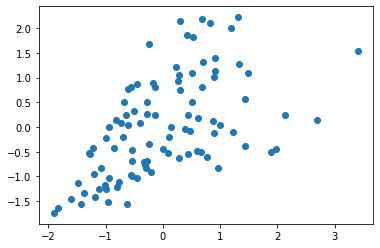

In [99]:
plt.scatter(X_train['Pop'], X_train['Total_2017'])

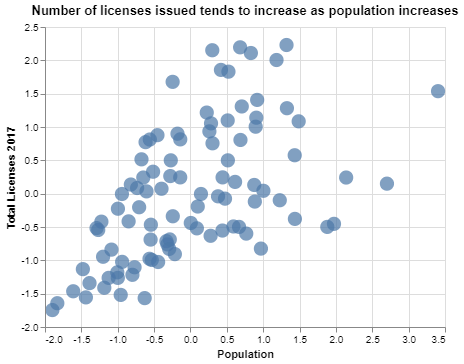

In [100]:
alt.Chart(X_train).mark_point(filled=True, size=200).encode(
x=alt.X('Pop', axis=alt.Axis(title='Population')),
y=alt.Y('Total_2017', axis=alt.Axis(title='Total Licenses 2017')),
).properties(title="Number of licenses issued tends to increase as population increases")

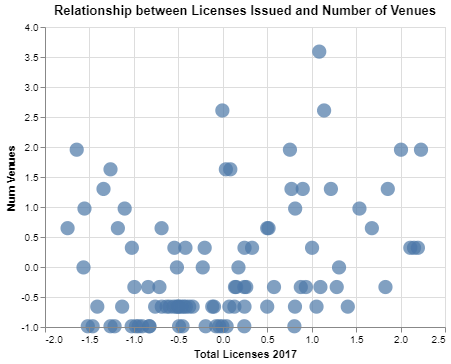

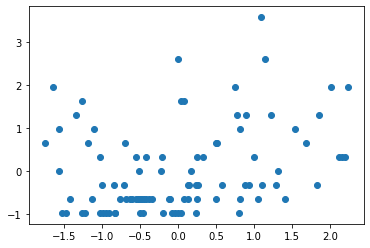

In [101]:
plt.scatter( X_train['Total_2017'],X_train['Venue'])
cluster_chart = alt.Chart(X_train).mark_point(filled=True, size=200).encode(
x=alt.X('Total_2017', axis=alt.Axis(title='Total Licenses 2017')),
y=alt.Y('Venue', axis=alt.Axis(title='Num Venues')),
).properties(title="Relationship between Licenses Issued and Number of Venues")
cluster_chart

In [102]:
X_train.corr()

,Pop,Total_2017,Venue
Pop,1.000000,0.554520,-0.031422
Total_2017,0.554520,1.000000,0.310917
Venue,-0.031422,0.310917,1.000000


**Clustering**

In [103]:
num_clusters = range(1, 20)

kmeans = [KMeans(n_clusters=i) for i in num_clusters]

score = [kmeans[i].fit(X_train).score(X_train) for i in range(len(kmeans))]
score

[-288.0,
 -183.60638283432422,
 -126.5321643723716,
 -102.92934349834779,
 -81.81721683733045,
 -68.08079091055234,
 -60.106916212174966,
 -52.32351686213519,
 -46.370053827864524,
 -40.999001746832775,
 -36.95130800397371,
 -32.92837376086126,
 -30.26956750195122,
 -26.919193800569126,
 -25.87013194197839,
 -23.1601207955518,
 -21.630721907395046,
 -20.839374875601585,
 -20.10597896908828]

In [106]:
i = 1
for s in score:
    print(score[i]-score[i-1])
i+=1

104.39361716567578
104.39361716567578
104.39361716567578
104.39361716567578
104.39361716567578
104.39361716567578
104.39361716567578
104.39361716567578
104.39361716567578
104.39361716567578
104.39361716567578
104.39361716567578
104.39361716567578
104.39361716567578
104.39361716567578
104.39361716567578
104.39361716567578
104.39361716567578
104.39361716567578


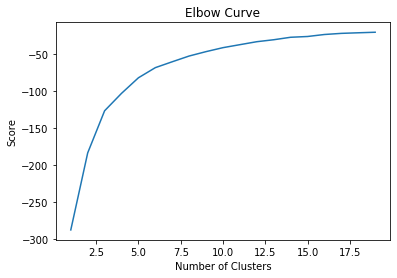

In [108]:
plt.plot(num_clusters, score)
plt.xlabel('Number of Clusters')

plt.ylabel('Score')

plt.title('Elbow Curve')

plt.show()

In [109]:
kclusters = 7

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(X_train)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[20:30]

array([0, 5, 6, 5, 6, 0, 5, 5, 2, 4])

In [110]:
toronto_total_pet_services['Cluster Labels'] = kmeans.labels_

toronto_total_pet_services.head()

,FSA,Borough,Neighborhood,Pop,Total_2017,PropTotal_2017,PerCapitaPets,Neighborhood Latitude,Neighborhood Longitude,Venue,PetServicesPerPerCapitaPet,Cluster Labels
53,M5V,Downtown Toronto,"CN Tower, Bathurst Quay, Island airport, Harbo...",49195.0,1340.0,1.66,0.0272,43.640816,-79.399536,14,514.705882,3
28,M4H,East York,Thorncliffe Park,19688.0,126.0,0.16,0.0064,43.698383,-79.358803,3,468.750000,4
40,M4Y,Downtown Toronto,Church and Wellesley,30472.0,841.0,1.04,0.0276,43.666336,-79.381195,11,398.550725,5
42,M5B,Downtown Toronto,"Ryerson, Garden District",12785.0,265.0,0.33,0.0207,43.657467,-79.377708,8,386.473430,1
45,M5G,Downtown Toronto,Central Bay Street,8423.0,131.0,0.16,0.0156,43.656078,-79.384918,6,384.615385,1


In [111]:
toronto_total_pet_services = toronto_total_pet_services.merge(toronto_merged[['FSA','Total_2013']],on='FSA')
toronto_total_pet_services.head()

,FSA,Borough,Neighborhood,Pop,Total_2017,PropTotal_2017,PerCapitaPets,Neighborhood Latitude,Neighborhood Longitude,Venue,PetServicesPerPerCapitaPet,Cluster Labels,Total_2013
0,M5V,Downtown Toronto,"CN Tower, Bathurst Quay, Island airport, Harbo...",49195.0,1340.0,1.66,0.0272,43.640816,-79.399536,14,514.705882,3,978.0
1,M4H,East York,Thorncliffe Park,19688.0,126.0,0.16,0.0064,43.698383,-79.358803,3,468.750000,4,124.0
2,M4Y,Downtown Toronto,Church and Wellesley,30472.0,841.0,1.04,0.0276,43.666336,-79.381195,11,398.550725,5,673.0
3,M5B,Downtown Toronto,"Ryerson, Garden District",12785.0,265.0,0.33,0.0207,43.657467,-79.377708,8,386.473430,1,196.0
4,M5G,Downtown Toronto,Central Bay Street,8423.0,131.0,0.16,0.0156,43.656078,-79.384918,6,384.615385,1,93.0


In [112]:
# create map to visualize the clusters
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i+x+(i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(toronto_total_pet_services['Neighborhood Latitude'], toronto_total_pet_services['Neighborhood Longitude'], toronto_total_pet_services['Neighborhood'], toronto_total_pet_services['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

In [114]:
cluster_summary=toronto_total_pet_services.groupby(['Cluster Labels'], as_index=False).agg('mean')
cluster_summary.sort_values('PetServicesPerPerCapitaPet', ascending=False, inplace=True)
cluster_summary

,Cluster Labels,Pop,Total_2017,PropTotal_2017,PerCapitaPets,Neighborhood Latitude,Neighborhood Longitude,Venue,PetServicesPerPerCapitaPet,Total_2013
3,3,51597.200000,1575.400000,1.948000,0.031960,43.683843,-79.383611,9.800000,319.174264,1397.200000
1,1,11440.727273,322.636364,0.396364,0.028736,43.667344,-79.390057,5.727273,238.891720,288.090909
5,5,24912.200000,1099.000000,1.357000,0.045410,43.684887,-79.390800,7.300000,175.086578,1039.600000
6,6,36403.461538,1544.230769,1.907692,0.043462,43.666845,-79.426266,3.153846,71.582701,1550.000000
4,4,17581.250000,393.500000,0.486000,0.024430,43.738246,-79.419612,0.900000,50.881687,403.100000
2,2,22415.866667,875.400000,1.081333,0.041273,43.692675,-79.390386,1.866667,46.205771,889.133333
0,0,42637.727273,793.454545,0.980909,0.019264,43.754327,-79.367303,0.818182,44.761063,840.954545


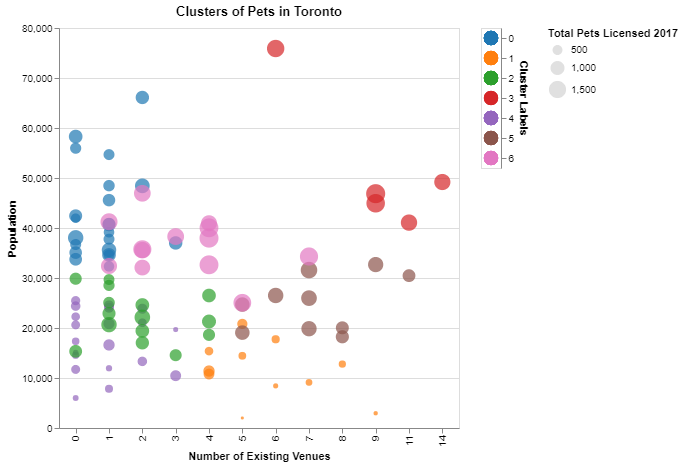

In [124]:
# allow cluster to be selected and highlighted

selection = alt.selection_multi(fields=['Cluster Labels'])
color = alt.condition(selection,
                      alt.Color('Cluster Labels:O', legend=None, 
                      scale=alt.Scale(scheme='category10')),
                      alt.value('lightgray'))

cluster_chart = alt.Chart(toronto_total_pet_services
 ).mark_point(filled=True, size=200).encode(
        x=alt.X('Venue:N', 
                axis=alt.Axis(title='Number of Existing Venues')),
        y=alt.Y('Pop', axis=alt.Axis(title='Population')),
        size=alt.Size('Total_2017',
                legend=alt.Legend(title='Total Pets Licensed 2017')),
        color=color,
        tooltip=['Cluster Labels','FSA']
).properties(title="Clusters of Pets in Toronto",height=400, width=400
).interactive()

legend = alt.Chart(toronto_total_pet_services
).mark_point(filled=True, size=200
).encode(
    y=alt.Y('Cluster Labels:O', axis=alt.Axis(orient='right')),
    color=color
).add_selection(
selection
)

total=cluster_chart | legend
total

In [116]:
pet_change_df = toronto_merged.melt(id_vars=['Borough','FSA'], value_vars=['Total_2013','Total_2017'], var_name='Year', value_name='TotalPets')
pet_change_df.head()

,Borough,FSA,Year,TotalPets
0,East Toronto,M4E,Total_2013,1582.0
1,West Toronto,M6R,Total_2013,1182.0
2,Etobicoke,M8W,Total_2013,1347.0
3,Central Toronto,M4T,Total_2013,627.0
4,Central Toronto,M4R,Total_2013,620.0


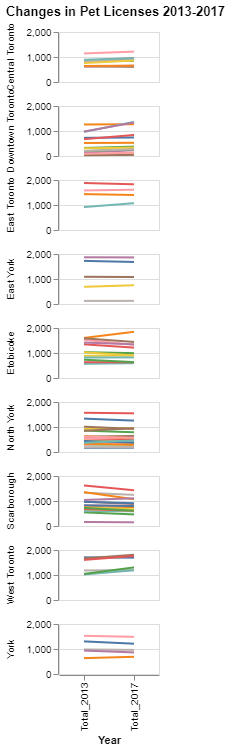

In [117]:
alt.Chart(pet_change_df).mark_line().encode(
    x=alt.X('Year'),
    y=alt.Y('TotalPets', axis=alt.Axis(title=None)),
    row=alt.Row('Borough:N', header=alt.Header(title='')),
    color=alt.Color('FSA',legend=None),
    tooltip='FSA'
).properties(
    width=100,
    height=50,
    title="Changes in Pet Licenses 2013-2017"
)

In [118]:
tmp_df = pd.merge(toronto_total_pet_services, pet_change_df, on='FSA')
tmp_df.head()

,FSA,Borough_x,Neighborhood,Pop,Total_2017,PropTotal_2017,PerCapitaPets,Neighborhood Latitude,Neighborhood Longitude,Venue,PetServicesPerPerCapitaPet,Cluster Labels,Total_2013,Borough_y,Year,TotalPets
0,M5V,Downtown Toronto,"CN Tower, Bathurst Quay, Island airport, Harbo...",49195.0,1340.0,1.66,0.0272,43.640816,-79.399536,14,514.705882,3,978.0,Downtown Toronto,Total_2013,978.0
1,M5V,Downtown Toronto,"CN Tower, Bathurst Quay, Island airport, Harbo...",49195.0,1340.0,1.66,0.0272,43.640816,-79.399536,14,514.705882,3,978.0,Downtown Toronto,Total_2017,1340.0
2,M4H,East York,Thorncliffe Park,19688.0,126.0,0.16,0.0064,43.698383,-79.358803,3,468.750000,4,124.0,East York,Total_2013,124.0
3,M4H,East York,Thorncliffe Park,19688.0,126.0,0.16,0.0064,43.698383,-79.358803,3,468.750000,4,124.0,East York,Total_2017,126.0
4,M4Y,Downtown Toronto,Church and Wellesley,30472.0,841.0,1.04,0.0276,43.666336,-79.381195,11,398.550725,5,673.0,Downtown Toronto,Total_2013,673.0


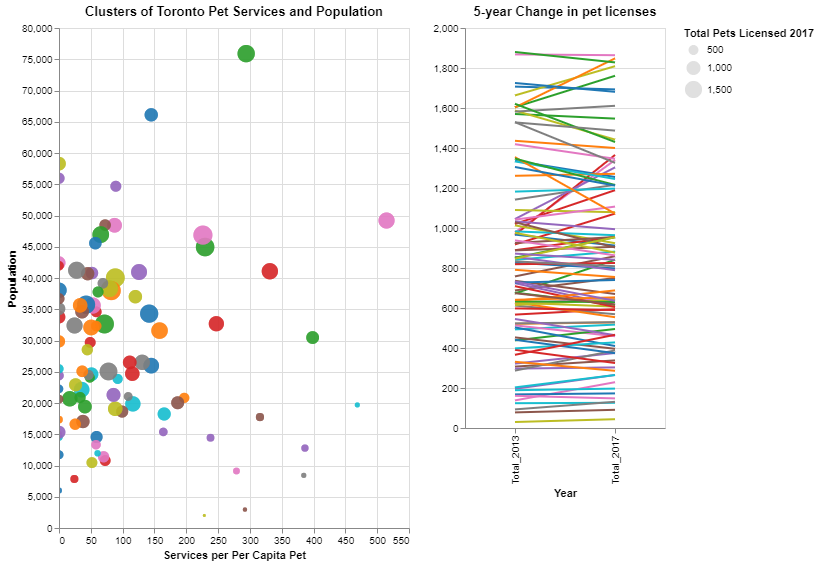

In [119]:
selector = alt.selection_single(empty='all', fields=['FSA'])


base = alt.Chart(tmp_df).properties(
    title="Pets in Toronto"
).add_selection(selector)

cluster_chart = base.mark_point(filled=True, size=200).encode(
    x=alt.X('PetServicesPerPerCapitaPet', axis=alt.Axis(title='Services per Per Capita Pet')),
    y=alt.Y('Pop', axis=alt.Axis(title='Population')),
    size=alt.Size('Total_2017',legend=alt.Legend(title='Total Pets Licensed 2017')),
    #color=alt.Color('Cluster Labels:O',scale=alt.Scale(scheme='category10'),legend=alt.Legend(title='Clusters')),
   # color=alt.condition(selector, 'Cluster Labels:O', alt.value('lightgray'), legend=None),
    color=alt.condition(selector, 'FSA:O', alt.value('lightgray'),legend=None,scale=alt.Scale(scheme='category10')),
    tooltip=['FSA','Neighborhood','PetServicesPerPerCapitaPet', 'Pop','Total_2017']
).properties(title="Clusters of Toronto Pet Services and Population", width=350, height=500).interactive()



changes_chart = base.mark_line().encode(
    x=alt.X('Year'),
    y=alt.Y('TotalPets', axis=alt.Axis(title=None)),
    #row=alt.Row('Borough:N', header=alt.Header(title='')),
    color=alt.Color('FSA:O',legend=None),
    tooltip=['FSA']
).transform_filter(
    selector
).properties(title='5-year Change in pet licenses',width=200, height=400)


total2=cluster_chart |changes_chart
total2

In [122]:
filtered_df = pet_change_df[(pet_change_df['FSA'].isin(['M5V', 'M4H','M4Y']))]

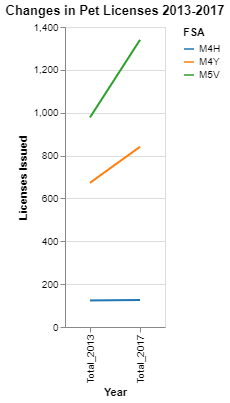

In [123]:
alt.Chart(filtered_df).mark_line().encode(
x=alt.X('Year'),
y=alt.Y('TotalPets', axis=alt.Axis(title='Licenses Issued')),
color=alt.Color('FSA:O', scale=alt.Scale(scheme='category10')),
tooltip=['FSA'] ).properties(title="Changes in Pet Licenses 2013-2017",width=100)

**Learn more about Clusters:**  *(Interested clusters are :1,3,5)*

In [125]:
clusters_of_interest = toronto_total_pet_services[(toronto_total_pet_services['Cluster Labels'] ==3) | (toronto_total_pet_services['Cluster Labels'] == 1) |
                                                  (toronto_total_pet_services['Cluster Labels'] == 5)]

In [126]:
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(3)
ys = [i+x+(i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]
rainbow[0] = '#e7298a'
rainbow[3] = '#6b6ecf'
#rainbow[7] = '#17becf'
# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(clusters_of_interest['Neighborhood Latitude'], clusters_of_interest['Neighborhood Longitude'], clusters_of_interest['Neighborhood'], clusters_of_interest['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

In [132]:
clusters_of_interest


,FSA,Borough,Neighborhood,Pop,Total_2017,PropTotal_2017,PerCapitaPets,Neighborhood Latitude,Neighborhood Longitude,Venue,PetServicesPerPerCapitaPet,Cluster Labels,Total_2013
0,M5V,Downtown Toronto,"CN Tower, Bathurst Quay, Island airport, Harbo...",49195.0,1340.0,1.66,0.0272,43.640816,-79.399536,14,514.705882,3,978.0
2,M4Y,Downtown Toronto,Church and Wellesley,30472.0,841.0,1.04,0.0276,43.666336,-79.381195,11,398.550725,5,673.0
3,M5B,Downtown Toronto,"Ryerson, Garden District",12785.0,265.0,0.33,0.0207,43.657467,-79.377708,8,386.473430,1,196.0
4,M5G,Downtown Toronto,Central Bay Street,8423.0,131.0,0.16,0.0156,43.656078,-79.384918,6,384.615385,1,93.0
5,M5A,Downtown Toronto,"Harbourfront, Regent Park",41078.0,1365.0,1.69,0.0332,43.655220,-79.361969,11,331.325301,3,966.0
6,M5T,Downtown Toronto,"Chinatown, Grange Park, Kensington Market",17748.0,338.0,0.42,0.0190,43.653511,-79.397224,6,315.789474,1,307.0
7,M2N,North York,Willowdale South,75897.0,1547.0,1.91,0.0204,43.768280,-79.407455,6,294.117647,3,1570.0
8,M5C,Downtown Toronto,St. James Town,2951.0,91.0,0.11,0.0308,43.651211,-79.375481,9,292.207792,1,78.0
9,M5E,Downtown Toronto,Berczy Park,9118.0,229.0,0.28,0.0251,43.643330,-79.372223,7,278.884462,1,138.0
10,M6J,West Toronto,"Little Portugal, Trinity",32684.0,1189.0,1.47,0.0364,43.648556,-79.417770,9,247.252747,5,1020.0


In [134]:
filtered_pet_services = toronto_total_pet_services[(toronto_total_pet_services['FSA'].isin(['M5V', 'M4Y','M5B']))]
filtered_pet_services

,FSA,Borough,Neighborhood,Pop,Total_2017,PropTotal_2017,PerCapitaPets,Neighborhood Latitude,Neighborhood Longitude,Venue,PetServicesPerPerCapitaPet,Cluster Labels,Total_2013
0,M5V,Downtown Toronto,"CN Tower, Bathurst Quay, Island airport, Harbo...",49195.0,1340.0,1.66,0.0272,43.640816,-79.399536,14,514.705882,3,978.0
2,M4Y,Downtown Toronto,Church and Wellesley,30472.0,841.0,1.04,0.0276,43.666336,-79.381195,11,398.550725,5,673.0
3,M5B,Downtown Toronto,"Ryerson, Garden District",12785.0,265.0,0.33,0.0207,43.657467,-79.377708,8,386.473430,1,196.0


In [148]:
# # create map of Toronto Neighbourhoods (FSAs) using retrived latitude and longitude values
map_toronto_pop = folium.Map(location=[latitude, longitude], zoom_start=10)

map_toronto_pop.choropleth(geo_data='toronto2.geojson',
data = filtered_pet_services,
columns=['FSA','Venue'],
key_on='feature.properties.CFSAUID',
fill_color='YlGn',
fill_opacity=0.7, 
line_opacity=0.2,
highlight=True,
label='FSA',
legend_name='Number of Pet Stores/Services')   

# # Layer on a marker
markers_colors = []
for lat, lon, fsa, poi, cluster in zip(filtered_pet_services['Neighborhood Latitude'], filtered_pet_services['Neighborhood Longitude'], filtered_pet_services['FSA'], filtered_pet_services['Neighborhood'], filtered_pet_services['Cluster Labels']):
    label = folium.Popup(str(fsa) + ' >> ' + str(poi) + ' >> Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
         [lat, lon],
         radius=5,
         popup=label,
         color=rainbow[cluster-1],
         fill=True,
         fill_color=rainbow[cluster-1],
         fill_opacity=0.7).add_to(map_toronto_pop)
       
map_toronto_pop

**Conclusion:**  
    *Examing with charts and maps possible candidates are:*  
    *Cluster#1 : M5B*  
    *Cluster#3 : M5V*  
    *Cluster#5 : M4Y*


In [161]:
filtered_pet_services

,FSA,Borough,Neighborhood,Pop,Total_2017,PropTotal_2017,PerCapitaPets,Neighborhood Latitude,Neighborhood Longitude,Venue,PetServicesPerPerCapitaPet,Cluster Labels,Total_2013
0,M5V,Downtown Toronto,"CN Tower, Bathurst Quay, Island airport, Harbo...",49195.0,1340.0,1.66,0.0272,43.640816,-79.399536,14,514.705882,3,978.0
2,M4Y,Downtown Toronto,Church and Wellesley,30472.0,841.0,1.04,0.0276,43.666336,-79.381195,11,398.550725,5,673.0
3,M5B,Downtown Toronto,"Ryerson, Garden District",12785.0,265.0,0.33,0.0207,43.657467,-79.377708,8,386.473430,1,196.0
